In [514]:
import pandas as pd
import numpy as np
import sklearn
import warnings
import time
warnings.filterwarnings('ignore')
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# pip install ipython-autotime
%load_ext autotime



time: 216 µs (started: 2024-03-05 18:24:51 +05:30)


In [494]:
br_can=pd.read_csv('breast_cancer.csv')

In [495]:
br_can=br_can.drop(columns=['id','Unnamed: 32'])
br_can.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [496]:
br_can.isnull().sum()

diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

In [497]:
br_can.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [498]:
# The scale of various columns in dataset is different, we will do normalisation/standardisation later on

In [503]:
# Checking skewness of data points, and comparing the change if we apply log transformation

skew_col=[]
skew_col_log=[]
for x in br_can.columns[1:]:
    val=br_can[x].skew()
    val_2=np.log1p(br_can[x]).skew()
    skew_col.append(val)
    skew_col_log.append(val_2)

# Adding data into dataframe to check the change
skewness_change=pd.DataFrame(zip(br_can.columns[1:],skew_col,skew_col_log),columns=['col','skew_before','skew_after'])


In [505]:
skewness_change

,col,skew_before,skew_after
0,radius_mean,0.942380,0.348744
1,texture_mean,0.650450,0.018733
2,perimeter_mean,0.990650,0.328800
3,area_mean,1.645732,0.287328
4,smoothness_mean,0.456324,0.406548
5,compactness_mean,1.190123,1.043195
6,concavity_mean,1.401180,1.206982
7,concave points_mean,1.171180,1.083180
8,symmetry_mean,0.725609,0.632718
9,fractal_dimension_mean,1.304489,1.272294


In [501]:
skewness_change=pd.melt(skewness_change,id_vars='col',value_vars=['skew_before','skew_after'])

<AxesSubplot: xlabel='col', ylabel='value'>

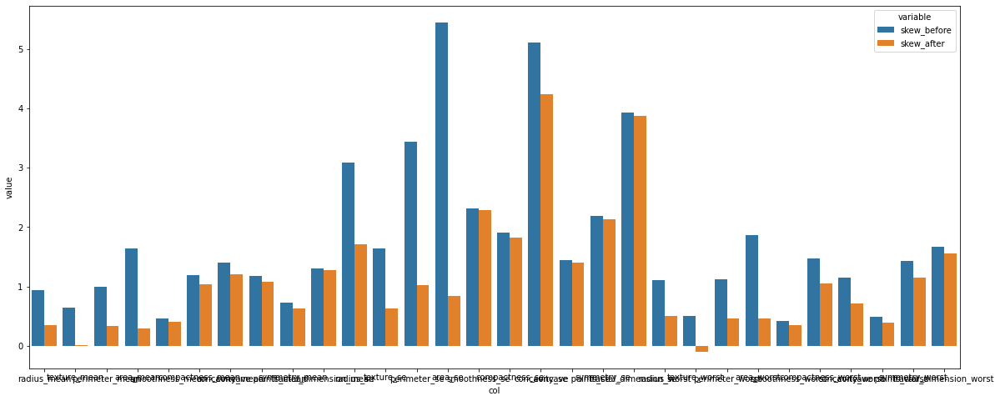

In [368]:
plt.figure(figsize=(20,8))
sns.barplot(data=skewness_change,x='col',y='value',hue='variable')


In [369]:
# Above we can see some features, where even after applying log transformation the skewness doesn't change
# Let's try normlaising the data set first and then applying the log transformation


In [370]:
br_can_2=br_can[br_can.columns[1:]]

In [371]:
br_can_normal=(br_can_2-br_can_2.min())/(br_can_2.max()-br_can_2.min())

In [372]:
# Checking skewness of data points, and comparing the change if we apply log transformation

skew_col=[]
skew_col_log=[]
for x in br_can_normal.columns:
    val=br_can_normal[x].skew()
    val_2=np.log1p(br_can_normal[x]).skew()
    skew_col.append(val)
    skew_col_log.append(val_2)

# Adding data into dataframe to check the change
skewness_change_2=pd.DataFrame(zip(br_can_normal.columns,skew_col,skew_col_log),columns=['col','skew_before','skew_after_norm'])
skewness_change_2=pd.melt(skewness_change_2,id_vars='col',value_vars=['skew_before','skew_after_norm'])



<AxesSubplot: xlabel='col', ylabel='value'>

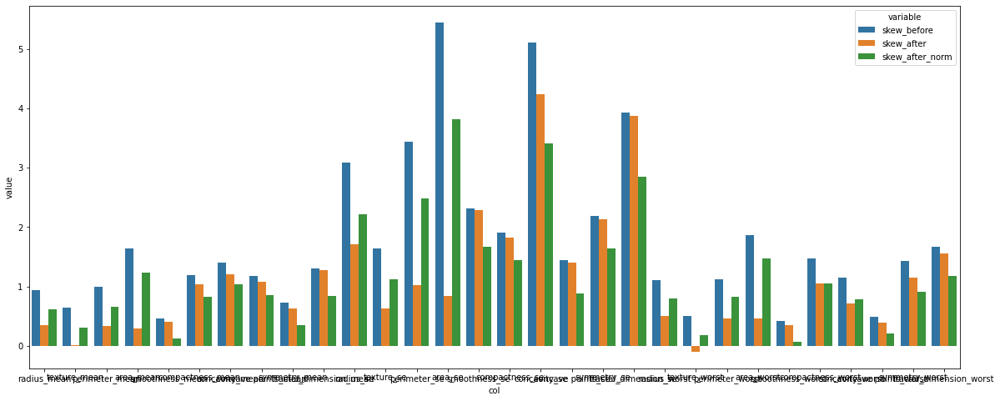

In [373]:
comb=skewness_change.append(skewness_change_2)
plt.figure(figsize=(20,8))
sns.barplot(data=comb,x='col',y='value',hue='variable')


In [374]:
comb[comb['value']>=1]['variable'].value_counts().reset_index()

,index,variable
0,skew_before,44
1,skew_after,15
2,skew_after_norm,14


In [375]:
# After doing the reverse,normalising and applying log_transformation, we do see
# skewness above 1 for certain parameters

# For now going ahead with normalisation first and then log_transformed dataset

In [376]:
for x in br_can_normal.columns:
    y=x+'_log'
    br_can_normal[y]=np.log1p(br_can_normal[x])

In [386]:
fn_norm_log=br_can_normal[['radius_mean_log',
       'texture_mean_log', 'perimeter_mean_log', 'area_mean_log',
       'smoothness_mean_log', 'compactness_mean_log', 'concavity_mean_log',
       'concave points_mean_log', 'symmetry_mean_log',
       'fractal_dimension_mean_log', 'radius_se_log', 'texture_se_log',
       'perimeter_se_log', 'area_se_log', 'smoothness_se_log',
       'compactness_se_log', 'concavity_se_log', 'concave points_se_log',
       'symmetry_se_log', 'fractal_dimension_se_log', 'radius_worst_log',
       'texture_worst_log', 'perimeter_worst_log', 'area_worst_log',
       'smoothness_worst_log', 'compactness_worst_log', 'concavity_worst_log',
       'concave points_worst_log', 'symmetry_worst_log',
       'fractal_dimension_worst_log']]

fn_norm_log['diagnosis']=br_can['diagnosis']

In [388]:
fn_norm_log.head()

,radius_mean_log,texture_mean_log,perimeter_mean_log,area_mean_log,smoothness_mean_log,compactness_mean_log,concavity_mean_log,concave points_mean_log,symmetry_mean_log,fractal_dimension_mean_log,...,texture_worst_log,perimeter_worst_log,area_worst_log,smoothness_worst_log,compactness_worst_log,concavity_worst_log,concave points_worst_log,symmetry_worst_log,fractal_dimension_worst_log,diagnosis
0,0.419393,0.022405,0.435664,0.310226,0.466092,0.583353,0.532473,0.548765,0.522575,0.473447,...,0.132365,0.511811,0.372045,0.470713,0.481989,0.450190,0.648164,0.469042,0.349857,M
1,0.496612,0.241041,0.479820,0.406525,0.254549,0.167012,0.185324,0.299184,0.321937,0.132188,...,0.265108,0.431664,0.361314,0.298291,0.143722,0.176447,0.494193,0.209928,0.201207,M
2,0.470938,0.329491,0.467340,0.371161,0.414959,0.358385,0.380155,0.492062,0.411842,0.191650,...,0.307540,0.411077,0.318096,0.394465,0.325971,0.307297,0.607073,0.339116,0.193454,M
3,0.190695,0.308101,0.209857,0.097948,0.594056,0.594079,0.448272,0.420592,0.574512,0.693147,...,0.326370,0.216197,0.089848,0.649964,0.595541,0.437379,0.633864,0.693147,0.573074,M
4,0.488514,0.145465,0.489185,0.398299,0.357920,0.298542,0.381116,0.417650,0.320838,0.171274,...,0.116835,0.410086,0.293844,0.362811,0.159066,0.277244,0.443672,0.146263,0.133302,M


In [409]:
# With Normalising and log transformation-
# we are reducing skewness, bringing data scale at par with each other columns, and
# Removing some outliers too


### Univariate Analysis

In [411]:
fn_norm_log.head()

,radius_mean_log,texture_mean_log,perimeter_mean_log,area_mean_log,smoothness_mean_log,compactness_mean_log,concavity_mean_log,concave points_mean_log,symmetry_mean_log,fractal_dimension_mean_log,...,texture_worst_log,perimeter_worst_log,area_worst_log,smoothness_worst_log,compactness_worst_log,concavity_worst_log,concave points_worst_log,symmetry_worst_log,fractal_dimension_worst_log,diagnosis
0,0.419393,0.022405,0.435664,0.310226,0.466092,0.583353,0.532473,0.548765,0.522575,0.473447,...,0.132365,0.511811,0.372045,0.470713,0.481989,0.450190,0.648164,0.469042,0.349857,M
1,0.496612,0.241041,0.479820,0.406525,0.254549,0.167012,0.185324,0.299184,0.321937,0.132188,...,0.265108,0.431664,0.361314,0.298291,0.143722,0.176447,0.494193,0.209928,0.201207,M
2,0.470938,0.329491,0.467340,0.371161,0.414959,0.358385,0.380155,0.492062,0.411842,0.191650,...,0.307540,0.411077,0.318096,0.394465,0.325971,0.307297,0.607073,0.339116,0.193454,M
3,0.190695,0.308101,0.209857,0.097948,0.594056,0.594079,0.448272,0.420592,0.574512,0.693147,...,0.326370,0.216197,0.089848,0.649964,0.595541,0.437379,0.633864,0.693147,0.573074,M
4,0.488514,0.145465,0.489185,0.398299,0.357920,0.298542,0.381116,0.417650,0.320838,0.171274,...,0.116835,0.410086,0.293844,0.362811,0.159066,0.277244,0.443672,0.146263,0.133302,M


<AxesSubplot: xlabel='variable', ylabel='value'>

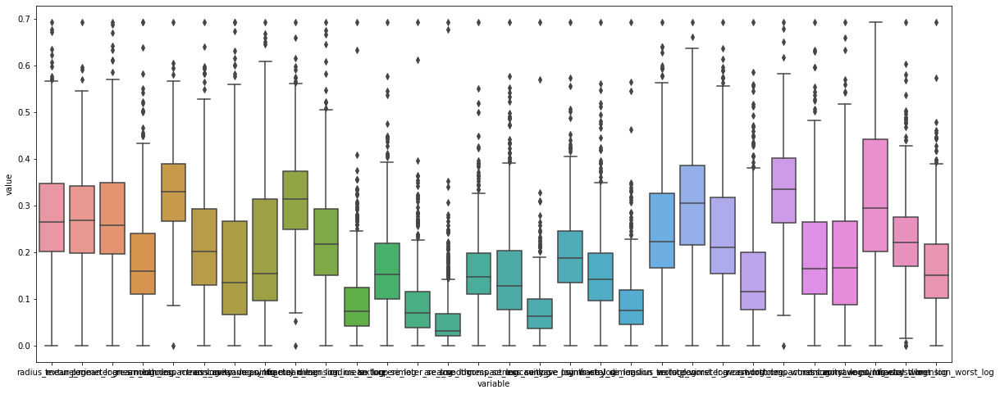

In [424]:
# Checking how many outliers still exists-

plt.figure(figsize=(20,8))
viz=pd.melt(fn_norm_log,id_vars='diagnosis')
sns.boxplot(data=viz,x='variable',y='value')

In [432]:
# We see too many outliers, checking log-transformation then normalisation output

In [433]:
for x in br_can.columns[1:]:
    y=x+'_log'
    br_can[y]=np.log1p(br_can[x])

br_can_log=br_can[['radius_mean_log',
       'texture_mean_log', 'perimeter_mean_log', 'area_mean_log',
       'smoothness_mean_log', 'compactness_mean_log', 'concavity_mean_log',
       'concave points_mean_log', 'symmetry_mean_log',
       'fractal_dimension_mean_log', 'radius_se_log', 'texture_se_log',
       'perimeter_se_log', 'area_se_log', 'smoothness_se_log',
       'compactness_se_log', 'concavity_se_log', 'concave points_se_log',
       'symmetry_se_log', 'fractal_dimension_se_log', 'radius_worst_log',
       'texture_worst_log', 'perimeter_worst_log', 'area_worst_log',
       'smoothness_worst_log', 'compactness_worst_log', 'concavity_worst_log',
       'concave points_worst_log', 'symmetry_worst_log',
       'fractal_dimension_worst_log']]

br_can_log_normal=(br_can_log-br_can_log.min())/(br_can_log.max()-br_can_log.min())
br_can_log_normal['diagnosis']=br_can['diagnosis']
br_can_log_normal.head()

,radius_mean_log,texture_mean_log,perimeter_mean_log,area_mean_log,smoothness_mean_log,compactness_mean_log,concavity_mean_log,concave points_mean_log,symmetry_mean_log,fractal_dimension_mean_log,...,texture_worst_log,perimeter_worst_log,area_worst_log,smoothness_worst_log,compactness_worst_log,concavity_worst_log,concave points_worst_log,symmetry_worst_log,fractal_dimension_worst_log,diagnosis
0,0.669889,0.045807,0.704853,0.679091,0.605740,0.813663,0.738368,0.748616,0.703716,0.610784,...,0.252199,0.807199,0.761908,0.616837,0.695530,0.662222,0.921584,0.640921,0.435400,M
1,0.768335,0.423561,0.759224,0.777607,0.300320,0.203629,0.234445,0.369938,0.399431,0.144035,...,0.463405,0.713090,0.751782,0.362739,0.207492,0.266563,0.667873,0.268206,0.234858,M
2,0.736146,0.551956,0.744044,0.743495,0.526788,0.465372,0.506852,0.656539,0.530129,0.214963,...,0.524811,0.687799,0.708663,0.500112,0.470483,0.458033,0.851657,0.448280,0.225054,M
3,0.341761,0.521846,0.389719,0.345566,0.818820,0.831389,0.608382,0.545635,0.790129,1.000000,...,0.551288,0.417531,0.356830,0.920405,0.859276,0.644100,0.897064,1.000000,0.785235,M
4,0.758238,0.271225,0.770523,0.769858,0.442667,0.380177,0.508261,0.541191,0.397889,0.190206,...,0.225161,0.686569,0.682584,0.453711,0.229639,0.414467,0.589518,0.183681,0.151114,M


<AxesSubplot: xlabel='variable', ylabel='value'>

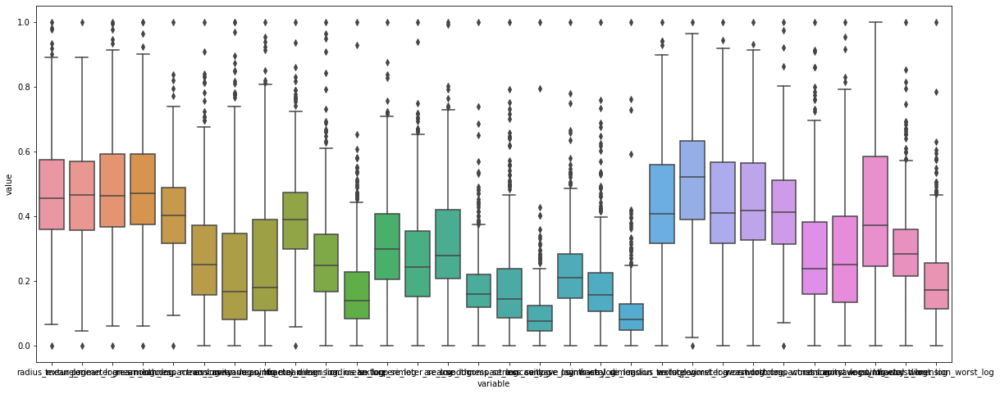

In [434]:
# Checking how many outliers still exists-

plt.figure(figsize=(20,8))
viz=pd.melt(br_can_log_normal,id_vars='diagnosis')
sns.boxplot(data=viz,x='variable',y='value')

In [435]:
# If we compare the above 2 box plots, we see that more outliers are removed with
# log_transformation first and normalisation later, as compared to vice-versa apporach

# So going forward with log then normalise approach

In [436]:
br_can_dataset=br_can_log_normal.copy()

In [438]:
br_can_dataset.head()

,radius_mean_log,texture_mean_log,perimeter_mean_log,area_mean_log,smoothness_mean_log,compactness_mean_log,concavity_mean_log,concave points_mean_log,symmetry_mean_log,fractal_dimension_mean_log,...,texture_worst_log,perimeter_worst_log,area_worst_log,smoothness_worst_log,compactness_worst_log,concavity_worst_log,concave points_worst_log,symmetry_worst_log,fractal_dimension_worst_log,diagnosis
0,0.669889,0.045807,0.704853,0.679091,0.605740,0.813663,0.738368,0.748616,0.703716,0.610784,...,0.252199,0.807199,0.761908,0.616837,0.695530,0.662222,0.921584,0.640921,0.435400,M
1,0.768335,0.423561,0.759224,0.777607,0.300320,0.203629,0.234445,0.369938,0.399431,0.144035,...,0.463405,0.713090,0.751782,0.362739,0.207492,0.266563,0.667873,0.268206,0.234858,M
2,0.736146,0.551956,0.744044,0.743495,0.526788,0.465372,0.506852,0.656539,0.530129,0.214963,...,0.524811,0.687799,0.708663,0.500112,0.470483,0.458033,0.851657,0.448280,0.225054,M
3,0.341761,0.521846,0.389719,0.345566,0.818820,0.831389,0.608382,0.545635,0.790129,1.000000,...,0.551288,0.417531,0.356830,0.920405,0.859276,0.644100,0.897064,1.000000,0.785235,M
4,0.758238,0.271225,0.770523,0.769858,0.442667,0.380177,0.508261,0.541191,0.397889,0.190206,...,0.225161,0.686569,0.682584,0.453711,0.229639,0.414467,0.589518,0.183681,0.151114,M


In [525]:
br_can_dataset.columns

Index(['radius_mean_log', 'texture_mean_log', 'perimeter_mean_log',
       'area_mean_log', 'smoothness_mean_log', 'compactness_mean_log',
       'concavity_mean_log', 'concave points_mean_log', 'symmetry_mean_log',
       'fractal_dimension_mean_log', 'radius_se_log', 'texture_se_log',
       'perimeter_se_log', 'area_se_log', 'smoothness_se_log',
       'compactness_se_log', 'concavity_se_log', 'concave points_se_log',
       'symmetry_se_log', 'fractal_dimension_se_log', 'radius_worst_log',
       'texture_worst_log', 'perimeter_worst_log', 'area_worst_log',
       'smoothness_worst_log', 'compactness_worst_log', 'concavity_worst_log',
       'concave points_worst_log', 'symmetry_worst_log',
       'fractal_dimension_worst_log', 'diagnosis'],
      dtype='object')

time: 4.94 ms (started: 2024-03-05 18:28:03 +05:30)


<AxesSubplot: xlabel='variable', ylabel='value'>

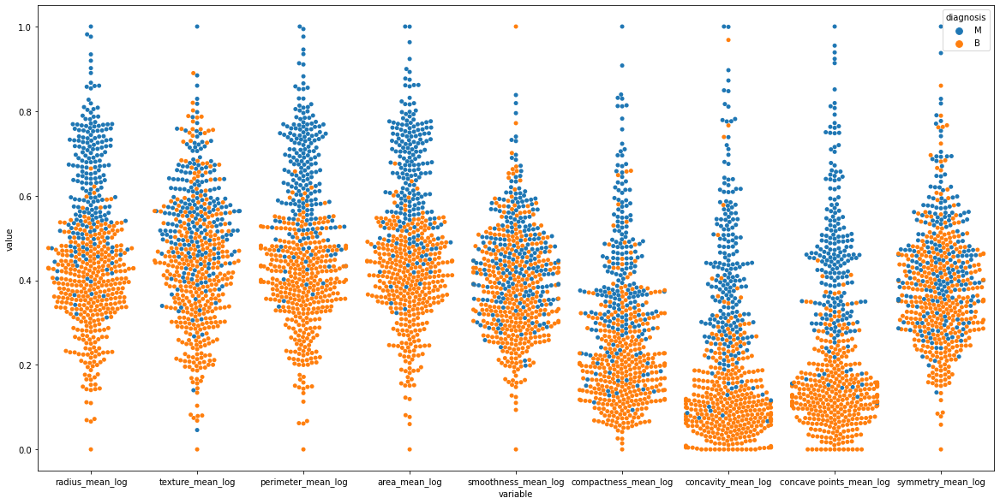

time: 2.03 s (started: 2024-03-05 18:29:21 +05:30)


In [529]:
# Drawing Swarm plot, as they give good information of data split

br_1=br_can_dataset[['radius_mean_log', 'texture_mean_log', 'perimeter_mean_log',
       'area_mean_log', 'smoothness_mean_log', 'compactness_mean_log',
       'concavity_mean_log', 'concave points_mean_log', 'symmetry_mean_log', 'diagnosis']]
viz=pd.melt(br_1,id_vars='diagnosis')
plt.figure(figsize=(20,10))
sns.swarmplot(data=viz,x='variable',y='value',hue='diagnosis')

<AxesSubplot: xlabel='variable', ylabel='value'>

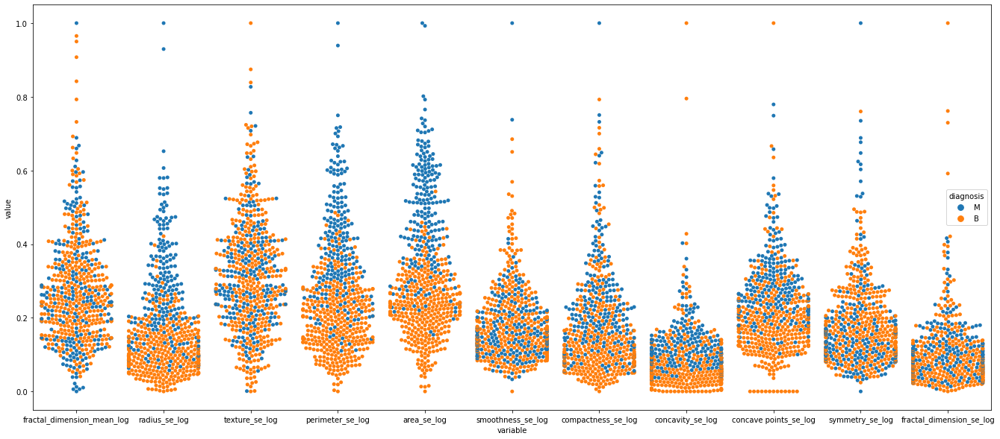

time: 3.48 s (started: 2024-03-05 19:02:32 +05:30)


In [533]:
br_1=br_can_dataset[['fractal_dimension_mean_log', 'radius_se_log', 'texture_se_log',
       'perimeter_se_log', 'area_se_log', 'smoothness_se_log',
       'compactness_se_log', 'concavity_se_log', 'concave points_se_log',
       'symmetry_se_log', 'fractal_dimension_se_log', 'diagnosis']]
viz=pd.melt(br_1,id_vars='diagnosis')
plt.figure(figsize=(23,10))
sns.swarmplot(data=viz,x='variable',y='value',hue='diagnosis')

<AxesSubplot: xlabel='variable', ylabel='value'>

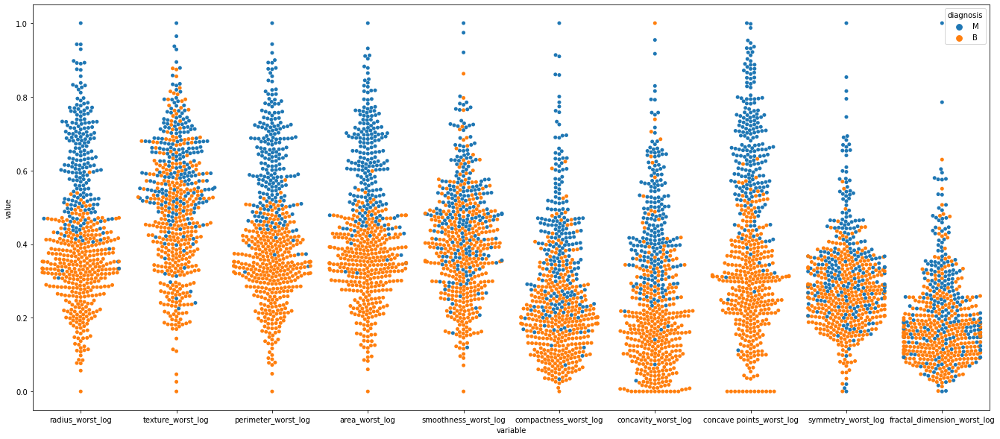

time: 2.24 s (started: 2024-03-05 19:03:08 +05:30)


In [534]:
br_1=br_can_dataset[['radius_worst_log',
       'texture_worst_log', 'perimeter_worst_log', 'area_worst_log',
       'smoothness_worst_log', 'compactness_worst_log', 'concavity_worst_log',
       'concave points_worst_log', 'symmetry_worst_log',
       'fractal_dimension_worst_log', 'diagnosis']]
viz=pd.melt(br_1,id_vars='diagnosis')
plt.figure(figsize=(23,10))
sns.swarmplot(data=viz,x='variable',y='value',hue='diagnosis')

In [536]:
# Using swarm plot we can see some variables which are able to properly distinguish 
# between type of tumour, i.e.no/very_less spillage of malignant with benign

# radius_worst, perimeter_worst, area_worst, concave_points_worst have good demarcation

time: 829 µs (started: 2024-03-05 19:27:14 +05:30)


### Bi-variate Analysis

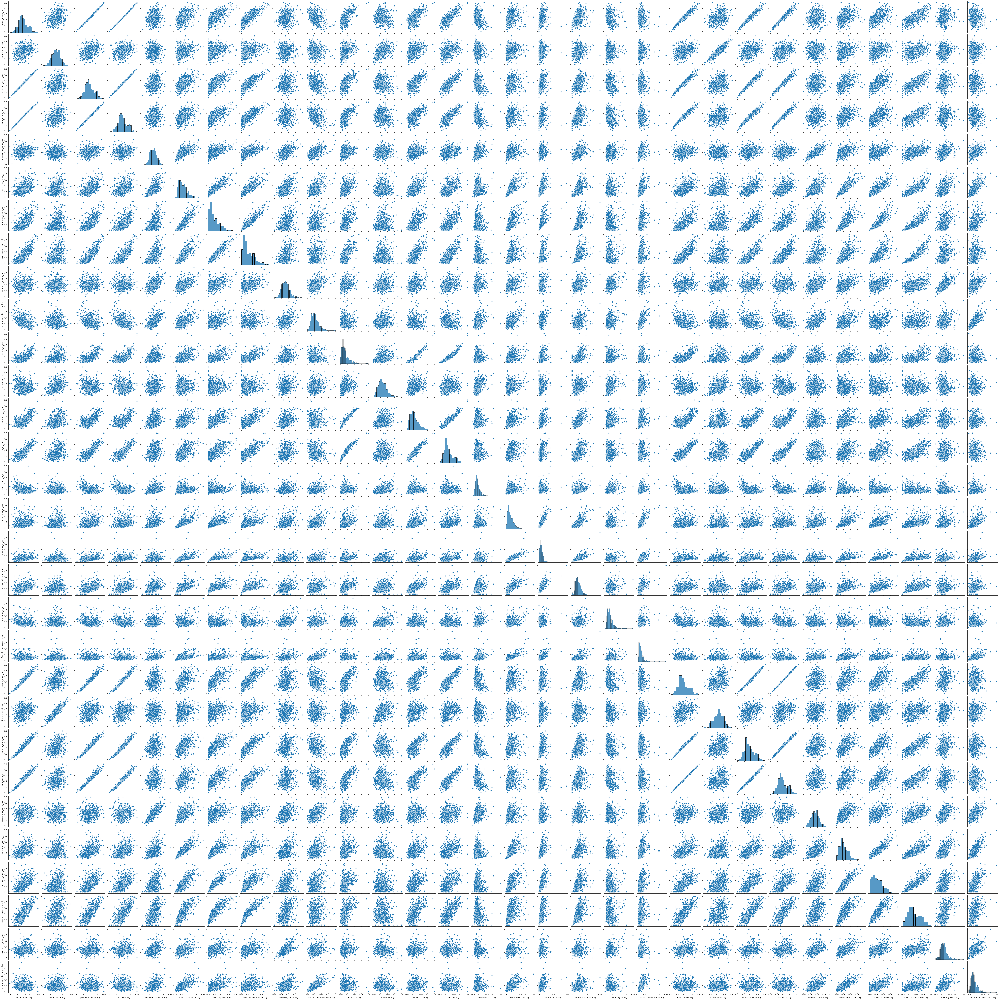

In [439]:
sns.pairplot(br_can_dataset)

In [482]:
# From the plot itself we can see some features are directly correlated. 
# Checking correlation of variables

<AxesSubplot: >

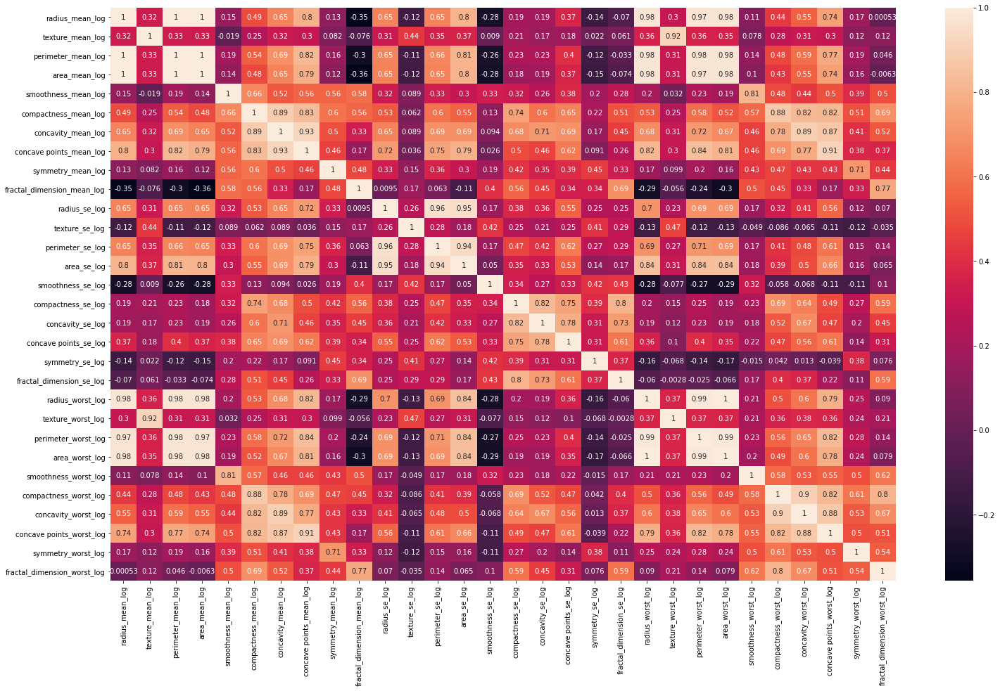

time: 2.56 s (started: 2024-03-08 09:45:12 +05:30)


In [568]:
plt.figure(figsize=(25,15))
sns.heatmap(br_can_dataset.corr(),annot=True)

In [554]:
# High correlations items
high_corr=pd.melt(correlation,id_vars='index')


time: 6.28 ms (started: 2024-03-07 19:48:00 +05:30)


In [584]:
# Removing those columns which have high correlation with each other above 0.85,
# Will keep only one column based on the above swarm plot, which has better separation of tumors

# area_mean -- area_worst,perimeter_mean,perimeter_worst,radius_mean,radius_worst
# Keeping --radius_worst_log

# texture_mean_log and texture_worst_log
# Keeping -- texture_mean_log

# compactness_mean_log, concavity_mean_log, compactness_worst
# Keeping --concavity_mean_log

# concavity_mean_log, concave points_mean_log,concave points_worst_log,concavity_worst_log
# Keeping -- concave points_mean_log

# radius_se_log, perimeter_se_log,area_se_log
# Keeping -- area_se_log


time: 225 µs (started: 2024-03-08 10:23:50 +05:30)


In [585]:
# # Drawing Swarm plot, as they give good information of data split

# br_1=br_can_dataset[['radius_se_log', 'perimeter_se_log','area_se_log','diagnosis']]
# viz=pd.melt(br_1,id_vars='diagnosis')
# plt.figure(figsize=(20,10))
# sns.swarmplot(data=viz,x='variable',y='value',hue='diagnosis')

time: 215 µs (started: 2024-03-08 10:24:06 +05:30)


<AxesSubplot: >

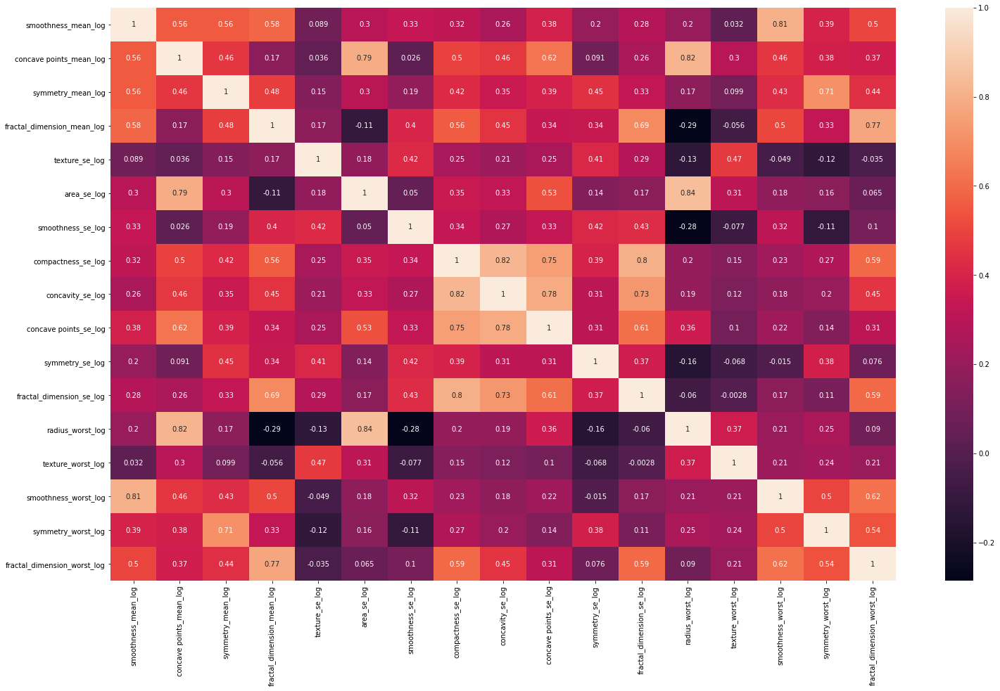

time: 1.14 s (started: 2024-03-08 10:23:13 +05:30)


In [583]:
plt.figure(figsize=(25,15))
sns.heatmap(br_can_dataset.drop(columns=['area_mean_log', 'area_worst_log', 'perimeter_mean_log',
       'perimeter_worst_log', 'radius_mean_log','texture_mean_log',
        'compactness_mean_log','compactness_worst_log','concavity_mean_log','concave points_worst_log',
                     'concavity_worst_log','radius_se_log', 'perimeter_se_log']).corr(),annot=True)

In [592]:
# Dataset left after removing correlated items

br_can_dataset_new=br_can_dataset.drop(columns=['area_mean_log', 'area_worst_log', 'perimeter_mean_log',
       'perimeter_worst_log', 'radius_mean_log','texture_mean_log',
        'compactness_mean_log','compactness_worst_log','concavity_mean_log','concave points_worst_log',
                     'concavity_worst_log','radius_se_log', 'perimeter_se_log'])

time: 1.15 ms (started: 2024-03-08 10:28:39 +05:30)


## Prediction Models

In [595]:
x_main=br_can_dataset_new.drop(columns='diagnosis')
y_main=br_can_dataset_new[['diagnosis']]


time: 2.32 ms (started: 2024-03-08 10:28:49 +05:30)


In [675]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,confusion_matrix,precision_score,recall_score,ConfusionMatrixDisplay,f1_score,classification_report

x_train,x_test,y_train,y_test=train_test_split(x_main,y_main,test_size=.25,random_state=1)

time: 2.12 ms (started: 2024-03-08 12:16:34 +05:30)


#### Logistic Regression

In [704]:
from sklearn.linear_model import LogisticRegression
lr=LogisticRegression()
lr.fit(x_train,y_train)
lr_pred=lr.predict(x_test)

time: 8.93 ms (started: 2024-03-08 12:30:31 +05:30)


In [758]:
def score(lr_pred):
    cm=confusion_matrix(y_test,lr_pred)
    cr=classification_report(y_test,lr_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=lr.classes_)
    disp.plot()
    print('Accuracy score is- ',accuracy_score(y_test,lr_pred))
    print('Precison Score is- ',precision_score(y_test,lr_pred,pos_label='M'))
    print('Recall Score is- ',recall_score(y_test,lr_pred,pos_label='M'))
    print('F1 Score is-',f1_score(y_test,lr_pred,pos_label='M'))
    print(cr)
    recall_score_obtained=recall_score(y_test,lr_pred,pos_label='M')
    return recall_score_obtained
    

time: 576 µs (started: 2024-03-08 14:50:21 +05:30)


Accuracy score is-  0.958041958041958
Precison Score is-  1.0
Recall Score is-  0.8909090909090909
F1 Score is- 0.9423076923076923
              precision    recall  f1-score   support

           B       0.94      1.00      0.97        88
           M       1.00      0.89      0.94        55

    accuracy                           0.96       143
   macro avg       0.97      0.95      0.95       143
weighted avg       0.96      0.96      0.96       143



0.8909090909090909

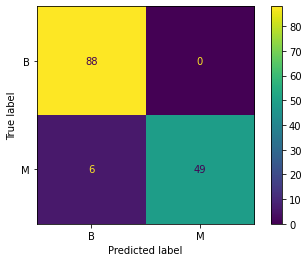

time: 219 ms (started: 2024-03-08 14:50:22 +05:30)


In [759]:
score(lr_pred)

In [710]:
# We need to improve our recall score as model is falsely calssifying Malignant cases to be benign

time: 209 µs (started: 2024-03-08 12:31:01 +05:30)


#### Using Support Vector classifiers

linear
Accuracy score is-  0.972027972027972
Precison Score is-  1.0
Recall Score is-  0.9272727272727272
F1 Score is- 0.9622641509433962
              precision    recall  f1-score   support

           B       0.96      1.00      0.98        88
           M       1.00      0.93      0.96        55

    accuracy                           0.97       143
   macro avg       0.98      0.96      0.97       143
weighted avg       0.97      0.97      0.97       143

poly
Accuracy score is-  0.965034965034965
Precison Score is-  0.9807692307692307
Recall Score is-  0.9272727272727272
F1 Score is- 0.9532710280373831
              precision    recall  f1-score   support

           B       0.96      0.99      0.97        88
           M       0.98      0.93      0.95        55

    accuracy                           0.97       143
   macro avg       0.97      0.96      0.96       143
weighted avg       0.97      0.97      0.96       143

rbf
Accuracy score is-  0.965034965034965
Precison Score 

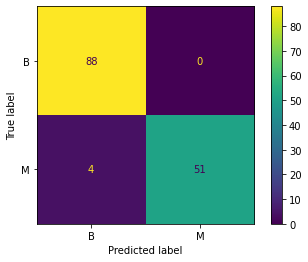

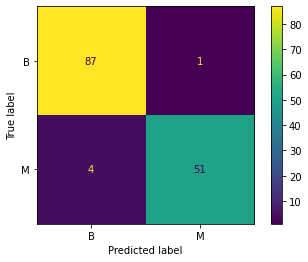

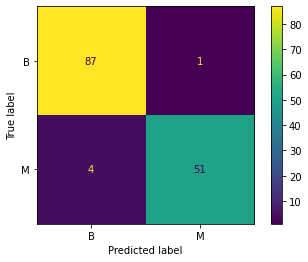

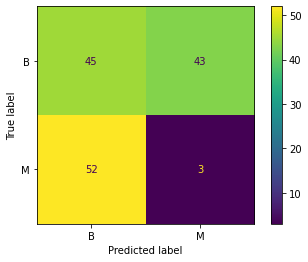

time: 775 ms (started: 2024-03-08 12:31:01 +05:30)


In [711]:
from sklearn.svm import SVC
kernel=['linear', 'poly', 'rbf', 'sigmoid',]
for x in kernel:
    svc= SVC(kernel=x,degree=3)
    svc.fit(x_train,y_train)
    svc_pred=svc.predict(x_test)
    print(x)
    score(svc_pred)

Accuracy score is-  0.972027972027972
Precison Score is-  1.0
Recall Score is-  0.9272727272727272
F1 Score is- 0.9622641509433962
              precision    recall  f1-score   support

           B       0.96      1.00      0.98        88
           M       1.00      0.93      0.96        55

    accuracy                           0.97       143
   macro avg       0.98      0.96      0.97       143
weighted avg       0.97      0.97      0.97       143



0.9272727272727272

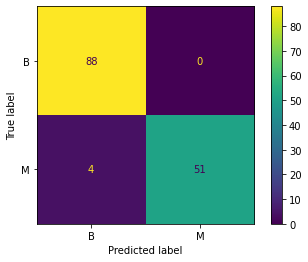

time: 227 ms (started: 2024-03-08 14:53:20 +05:30)


In [764]:
# taking best SVC model

svc= SVC(kernel='linear',degree=3)
svc.fit(x_train,y_train)
svc_pred=svc.predict(x_test)
score(svc_pred)

In [712]:
# We know there is trade-off in accuracy and precision, compared to logistic regression-
# as recall increased, precision decreased. 

# However for this use cases we are good with increasing recall as we don't want to lose out on 
# wrongly classify Malignant cases

# Above we can see that the linear model gives best recall and F1 score

time: 200 µs (started: 2024-03-08 12:31:02 +05:30)


### Using Tree based models

#### Decision tree

In [715]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV,KFold

param={'criterion':('gini','entropy'),'splitter':('best','random')}
kf=KFold(n_splits=5)
dtc=DecisionTreeClassifier()

gd=GridSearchCV(estimator=dtc,param_grid=param,cv=kf).fit(x_train,y_train)


time: 133 ms (started: 2024-03-08 12:31:08 +05:30)


In [716]:
dtc_pred=gd.best_estimator_.predict(x_test)

time: 1.9 ms (started: 2024-03-08 12:31:09 +05:30)


Accuracy score is-  0.9440559440559441
Precison Score is-  0.9795918367346939
Recall Score is-  0.8727272727272727
F1 Score is- 0.923076923076923
              precision    recall  f1-score   support

           B       0.93      0.99      0.96        88
           M       0.98      0.87      0.92        55

    accuracy                           0.94       143
   macro avg       0.95      0.93      0.94       143
weighted avg       0.95      0.94      0.94       143



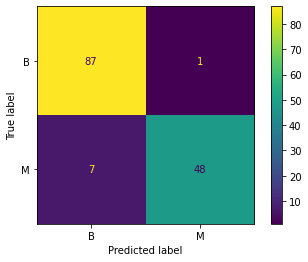

time: 206 ms (started: 2024-03-08 12:31:10 +05:30)


In [717]:
score(dtc_pred)

#### Using Random Forest

In [731]:
from sklearn.ensemble import RandomForestClassifier

rfc=RandomForestClassifier()
params={'n_estimators':[50,100,200,300,400,500],'criterion':['gini','entropy']}
grid=GridSearchCV(estimator=rfc,param_grid=params).fit(x_train,y_train)
rfc_pred=grid.best_estimator_.predict(x_test)


time: 20.2 s (started: 2024-03-08 14:36:45 +05:30)


Accuracy score is-  0.965034965034965
Precison Score is-  0.9807692307692307
Recall Score is-  0.9272727272727272
F1 Score is- 0.9532710280373831
              precision    recall  f1-score   support

           B       0.96      0.99      0.97        88
           M       0.98      0.93      0.95        55

    accuracy                           0.97       143
   macro avg       0.97      0.96      0.96       143
weighted avg       0.97      0.97      0.96       143



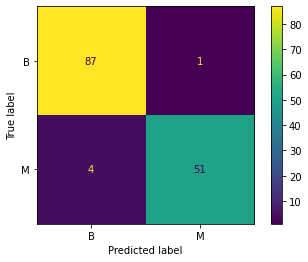

time: 206 ms (started: 2024-03-08 14:38:28 +05:30)


In [739]:
score(rfc_pred)

#### Using Gradient Boosting

In [742]:
from sklearn.ensemble import GradientBoostingClassifier

params={'n_estimators':[50,100,200,300,400,500],'learning_rate':[0.01,0.05,0.1,0.25,0.5]}
gbc=GradientBoostingClassifier()
grid=GridSearchCV(estimator=gbc,param_grid=params,cv=kf).fit(x_train,y_train)


time: 51.4 s (started: 2024-03-08 14:42:07 +05:30)


In [746]:
gbc_pred=grid.best_estimator_.predict(x_test)

time: 2.26 ms (started: 2024-03-08 14:44:28 +05:30)


Accuracy score is-  0.965034965034965
Precison Score is-  0.9807692307692307
Recall Score is-  0.9272727272727272
F1 Score is- 0.9532710280373831
              precision    recall  f1-score   support

           B       0.96      0.99      0.97        88
           M       0.98      0.93      0.95        55

    accuracy                           0.97       143
   macro avg       0.97      0.96      0.96       143
weighted avg       0.97      0.97      0.96       143



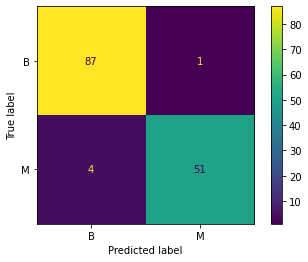

time: 212 ms (started: 2024-03-08 14:44:36 +05:30)


In [747]:
score(gbc_pred)

#### Using XGboost

In [749]:
import xgboost as xgb

time: 269 µs (started: 2024-03-08 14:45:26 +05:30)


In [752]:
xgb_c=xgb.XGBRFClassifier()
xgb_c.fit(x_train,y_train)

[14:47:04] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBRFClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
                colsample_bytree=1, gamma=0, gpu_id=-1, importance_type='gain',
                interaction_constraints='', max_delta_step=0, max_depth=6,
                min_child_weight=1, missing=nan, monotone_constraints='()',
                n_estimators=100, n_jobs=12, num_parallel_tree=100,
                objective='binary:logistic', random_state=0, reg_alpha=0,
                scale_pos_weight=1, tree_method='exact', validate_parameters=1,
                verbosity=None)

time: 113 ms (started: 2024-03-08 14:47:04 +05:30)


In [755]:
xgb_pred=xgb_c.predict(x_test)

time: 2.94 ms (started: 2024-03-08 14:47:43 +05:30)


Accuracy score is-  0.965034965034965
Precison Score is-  0.9807692307692307
Recall Score is-  0.9272727272727272
F1 Score is- 0.9532710280373831
              precision    recall  f1-score   support

           B       0.96      0.99      0.97        88
           M       0.98      0.93      0.95        55

    accuracy                           0.97       143
   macro avg       0.97      0.96      0.96       143
weighted avg       0.97      0.97      0.96       143



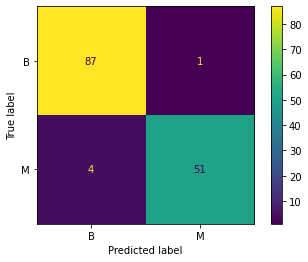

time: 209 ms (started: 2024-03-08 14:47:50 +05:30)


In [756]:
score(xgb_pred)

In [757]:
# Geting a combined score of all the models

time: 205 µs (started: 2024-03-08 14:48:14 +05:30)


Accuracy score is-  0.958041958041958
Precison Score is-  1.0
Recall Score is-  0.8909090909090909
F1 Score is- 0.9423076923076923
              precision    recall  f1-score   support

           B       0.94      1.00      0.97        88
           M       1.00      0.89      0.94        55

    accuracy                           0.96       143
   macro avg       0.97      0.95      0.95       143
weighted avg       0.96      0.96      0.96       143

Accuracy score is-  0.972027972027972
Precison Score is-  1.0
Recall Score is-  0.9272727272727272
F1 Score is- 0.9622641509433962
              precision    recall  f1-score   support

           B       0.96      1.00      0.98        88
           M       1.00      0.93      0.96        55

    accuracy                           0.97       143
   macro avg       0.98      0.96      0.97       143
weighted avg       0.97      0.97      0.97       143

Accuracy score is-  0.9440559440559441
Precison Score is-  0.9795918367346939
Recall

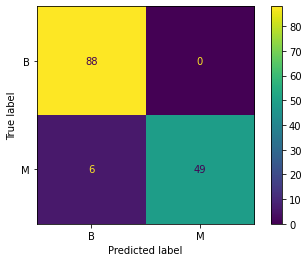

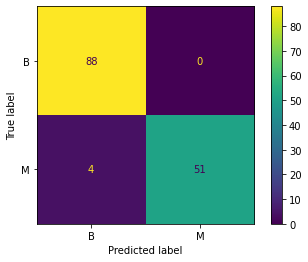

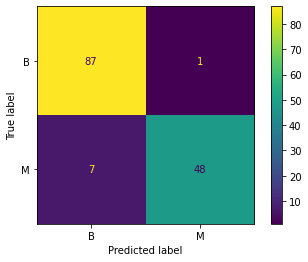

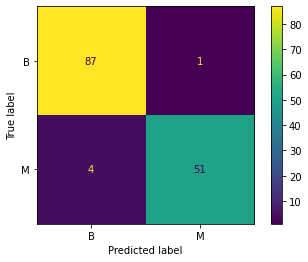

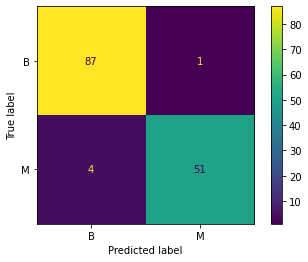

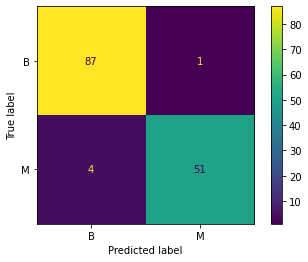

time: 1.24 s (started: 2024-03-08 14:53:29 +05:30)


In [765]:
model=['Logistic_Regression','Support Vector Classifier','Decision Tree','Random Forest','Gradient Boossting', 'XGB']
recall=[score(lr_pred),score(svc_pred),score(dtc_pred),score(rfc_pred),score(gbc_pred),score(xgb_pred)]

combined_scores=pd.DataFrame(zip(model,recall),columns=['Model','recall_score'])


<AxesSubplot: xlabel='Model', ylabel='recall_score'>

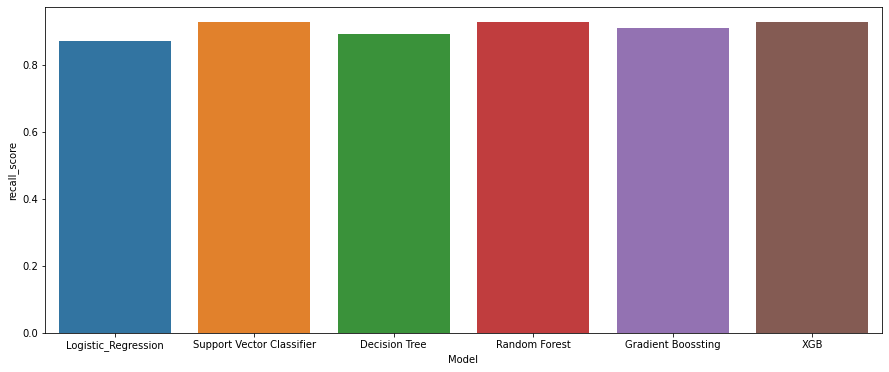

time: 187 ms (started: 2024-03-08 15:56:02 +05:30)


In [806]:
combined_scores
plt.figure(figsize=(15,6))
sns.barplot(data=combined_scores,x='Model',y='recall_score')

In [807]:
# From above we see that the performances are same for majority of models

time: 215 µs (started: 2024-03-08 15:56:07 +05:30)


<AxesSubplot: xlabel='feature', ylabel='importance'>

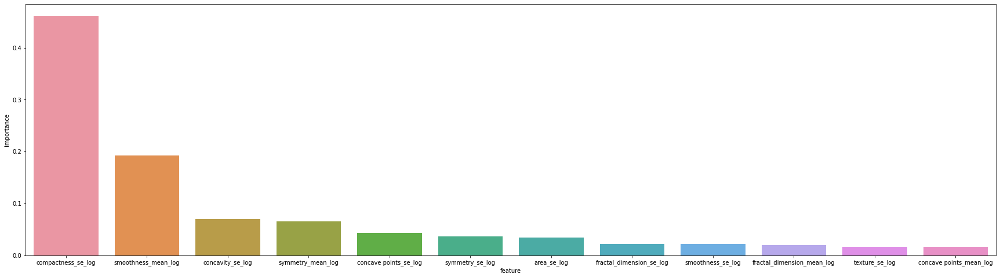

time: 271 ms (started: 2024-03-08 15:56:08 +05:30)


In [808]:
# Checking feature importances-
feature_importances=pd.DataFrame(zip(br_can_dataset_new.columns,xgb_c.feature_importances_),columns=['feature','importance']).sort_values(by='importance',ascending=False)
plt.figure(figsize=(30,8))
sns.barplot(data=feature_importances,x='feature',y='importance')


In [809]:
# Dropping the bottom 5 and checking the impact 
feature_importances.tail(5)['feature']

11      fractal_dimension_se_log
6              smoothness_se_log
3     fractal_dimension_mean_log
4                 texture_se_log
1        concave points_mean_log
Name: feature, dtype: object

time: 2.93 ms (started: 2024-03-08 15:56:09 +05:30)


In [791]:
br_can_dataset_new_2=br_can_dataset_new.drop(columns=['fractal_dimension_se_log','compactness_se_log',
    'symmetry_mean_log','fractal_dimension_mean_log','smoothness_mean_log'])

time: 4.49 ms (started: 2024-03-08 15:50:10 +05:30)


linear
poly
rbf
sigmoid
[15:51:22] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<AxesSubplot: xlabel='Model', ylabel='recall_score'>

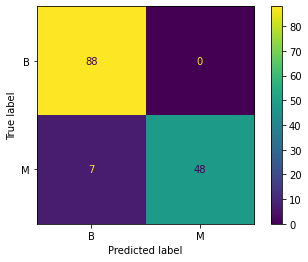

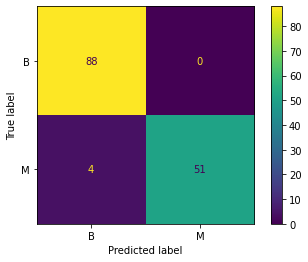

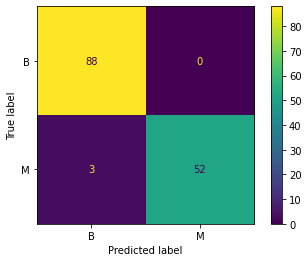

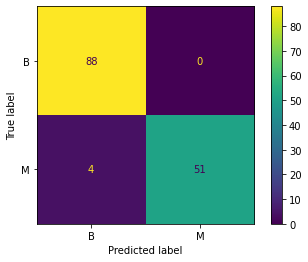

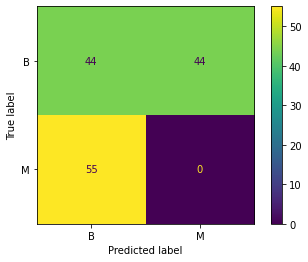

...

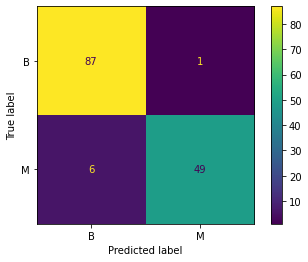

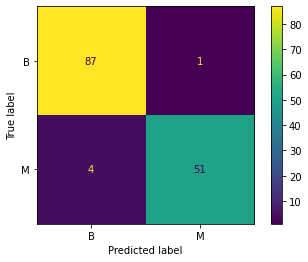

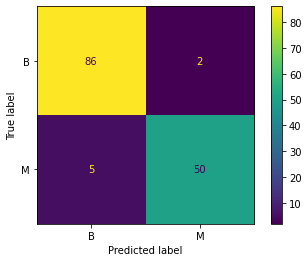

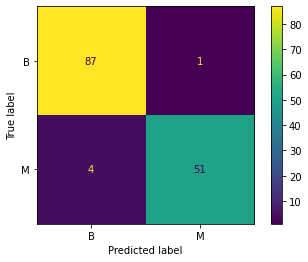

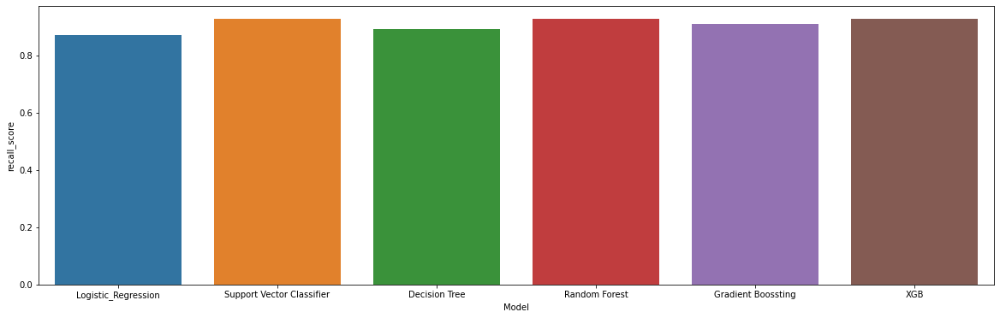

time: 1min 2s (started: 2024-03-08 15:50:23 +05:30)


In [792]:
x_main=br_can_dataset_new_2.drop(columns='diagnosis')
y_main=br_can_dataset_new_2[['diagnosis']]


from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,confusion_matrix,precision_score,recall_score,ConfusionMatrixDisplay,f1_score,classification_report

x_train,x_test,y_train,y_test=train_test_split(x_main,y_main,test_size=.25,random_state=1)

#### Logistic Regression

from sklearn.linear_model import LogisticRegression
lr=LogisticRegression()
lr.fit(x_train,y_train)
lr_pred=lr.predict(x_test)

def score(lr_pred):
    cm=confusion_matrix(y_test,lr_pred)
    cr=classification_report(y_test,lr_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=lr.classes_)
    disp.plot()
#     print('Accuracy score is- ',accuracy_score(y_test,lr_pred))
#     print('Precison Score is- ',precision_score(y_test,lr_pred,pos_label='M'))
#     print('Recall Score is- ',recall_score(y_test,lr_pred,pos_label='M'))
#     print('F1 Score is-',f1_score(y_test,lr_pred,pos_label='M'))
#     print(cr)
    recall_score_obtained=recall_score(y_test,lr_pred,pos_label='M')
    return recall_score_obtained
    

score(lr_pred)

# We need to improve our recall score as model is falsely calssifying Malignant cases to be benign

#### Using Support Vector classifiers

from sklearn.svm import SVC
kernel=['linear', 'poly', 'rbf', 'sigmoid',]
for x in kernel:
    svc= SVC(kernel=x,degree=3)
    svc.fit(x_train,y_train)
    svc_pred=svc.predict(x_test)
    print(x)
    score(svc_pred)

# taking best SVC model

svc= SVC(kernel='linear',degree=3)
svc.fit(x_train,y_train)
svc_pred=svc.predict(x_test)
score(svc_pred)

# We know there is trade-off in accuracy and precision, compared to logistic regression-
# as recall increased, precision decreased. 

# However for this use cases we are good with increasing recall as we don't want to lose out on 
# wrongly classify Malignant cases

# Above we can see that the linear model gives best recall and F1 score

### Using Tree based models

#### Decision tree

from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV,KFold

param={'criterion':('gini','entropy'),'splitter':('best','random')}
kf=KFold(n_splits=5)
dtc=DecisionTreeClassifier()

gd=GridSearchCV(estimator=dtc,param_grid=param,cv=kf).fit(x_train,y_train)


dtc_pred=gd.best_estimator_.predict(x_test)

score(dtc_pred)

#### Using Random Forest

from sklearn.ensemble import RandomForestClassifier

rfc=RandomForestClassifier()
params={'n_estimators':[50,100,200,300,400,500],'criterion':['gini','entropy']}
grid=GridSearchCV(estimator=rfc,param_grid=params).fit(x_train,y_train)
rfc_pred=grid.best_estimator_.predict(x_test)


score(rfc_pred)

#### Using Gradient Boosting

from sklearn.ensemble import GradientBoostingClassifier

params={'n_estimators':[50,100,200,300,400,500],'learning_rate':[0.01,0.05,0.1,0.25,0.5]}
gbc=GradientBoostingClassifier()
grid=GridSearchCV(estimator=gbc,param_grid=params,cv=kf).fit(x_train,y_train)


gbc_pred=grid.best_estimator_.predict(x_test)

score(gbc_pred)

#### Using XGboost

import xgboost as xgb

xgb_c=xgb.XGBRFClassifier()
xgb_c.fit(x_train,y_train)

xgb_pred=xgb_c.predict(x_test)

score(xgb_pred)

# Geting a combined score of all the models

model=['Logistic_Regression','Support Vector Classifier','Decision Tree','Random Forest','Gradient Boossting', 'XGB']
recall=[score(lr_pred),score(svc_pred),score(dtc_pred),score(rfc_pred),score(gbc_pred),score(xgb_pred)]

combined_scores=pd.DataFrame(zip(model,recall),columns=['Model','recall_score'])


<AxesSubplot: xlabel='Model', ylabel='recall_score'>

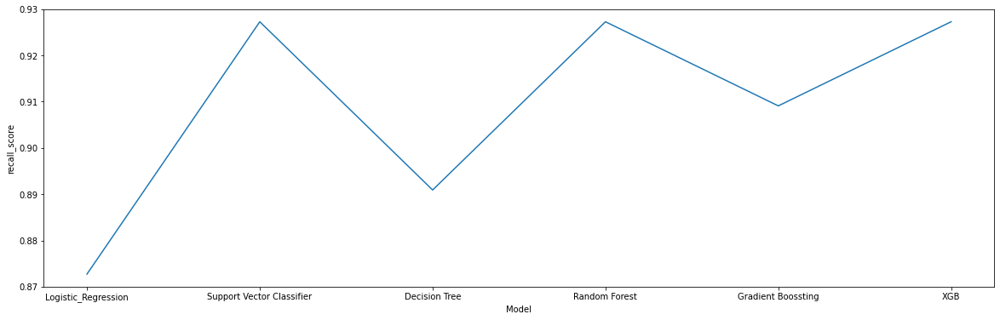

time: 215 ms (started: 2024-03-08 15:53:18 +05:30)


In [795]:
combined_scores
plt.figure(figsize=(20,6))
sns.lineplot(data=combined_scores,x='Model',y='recall_score')

In [810]:
# Again getting similar performances

time: 204 µs (started: 2024-03-08 15:56:33 +05:30)


## Applying PCA

In [817]:
from sklearn.decomposition import PCA
pca=PCA(n_components=10)
x_train_pca=pca.fit_transform(x_train)
x_test_pca=pca.transform(x_test)


time: 4.75 ms (started: 2024-03-08 16:14:27 +05:30)


In [818]:
pca.explained_variance_ratio_

array([0.43393242, 0.16254278, 0.12588142, 0.11432721, 0.05300045,
       0.04351221, 0.01949547, 0.01736203, 0.01315117, 0.00669204])

time: 1.8 ms (started: 2024-03-08 16:14:28 +05:30)


In [819]:
pca.explained_variance_ratio_.sum()

0.9898971940498683

time: 1.82 ms (started: 2024-03-08 16:14:28 +05:30)


In [820]:
x_train=x_train_pca.copy()
x_test=x_test_pca.copy()

time: 636 µs (started: 2024-03-08 16:16:07 +05:30)


linear
poly
rbf
sigmoid
[16:17:04] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


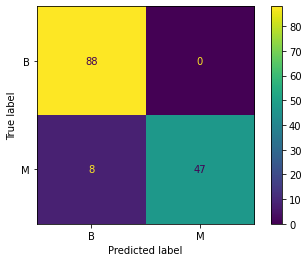

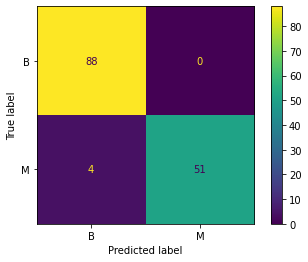

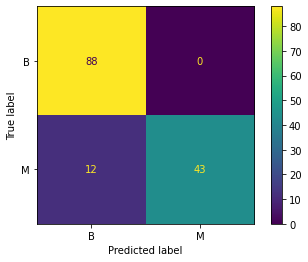

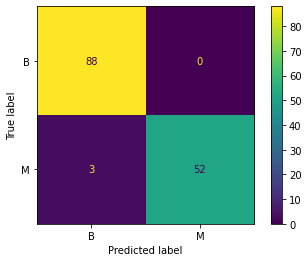

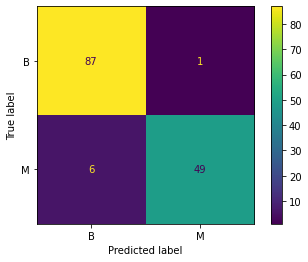

...

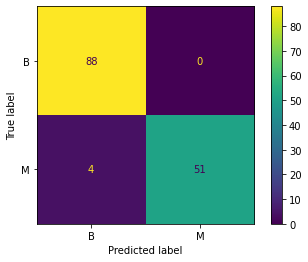

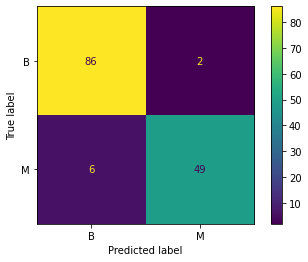

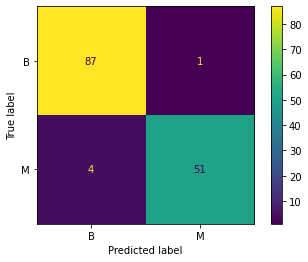

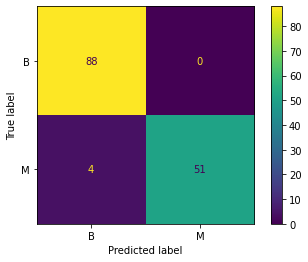

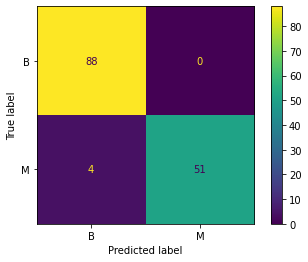

time: 1min (started: 2024-03-08 16:16:07 +05:30)


In [821]:
#### Logistic Regression

from sklearn.linear_model import LogisticRegression
lr=LogisticRegression()
lr.fit(x_train,y_train)
lr_pred=lr.predict(x_test)

def score(lr_pred):
    cm=confusion_matrix(y_test,lr_pred)
    cr=classification_report(y_test,lr_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=lr.classes_)
    disp.plot()
#     print('Accuracy score is- ',accuracy_score(y_test,lr_pred))
#     print('Precison Score is- ',precision_score(y_test,lr_pred,pos_label='M'))
#     print('Recall Score is- ',recall_score(y_test,lr_pred,pos_label='M'))
#     print('F1 Score is-',f1_score(y_test,lr_pred,pos_label='M'))
#     print(cr)
    recall_score_obtained=recall_score(y_test,lr_pred,pos_label='M')
    return recall_score_obtained
    

score(lr_pred)

# We need to improve our recall score as model is falsely calssifying Malignant cases to be benign

#### Using Support Vector classifiers

from sklearn.svm import SVC
kernel=['linear', 'poly', 'rbf', 'sigmoid',]
for x in kernel:
    svc= SVC(kernel=x,degree=3)
    svc.fit(x_train,y_train)
    svc_pred=svc.predict(x_test)
    print(x)
    score(svc_pred)

# taking best SVC model

svc= SVC(kernel='linear',degree=3)
svc.fit(x_train,y_train)
svc_pred=svc.predict(x_test)
score(svc_pred)

# We know there is trade-off in accuracy and precision, compared to logistic regression-
# as recall increased, precision decreased. 

# However for this use cases we are good with increasing recall as we don't want to lose out on 
# wrongly classify Malignant cases

# Above we can see that the linear model gives best recall and F1 score

### Using Tree based models

#### Decision tree

from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV,KFold

param={'criterion':('gini','entropy'),'splitter':('best','random')}
kf=KFold(n_splits=5)
dtc=DecisionTreeClassifier()

gd=GridSearchCV(estimator=dtc,param_grid=param,cv=kf).fit(x_train,y_train)


dtc_pred=gd.best_estimator_.predict(x_test)

score(dtc_pred)

#### Using Random Forest

from sklearn.ensemble import RandomForestClassifier

rfc=RandomForestClassifier()
params={'n_estimators':[50,100,200,300,400,500],'criterion':['gini','entropy']}
grid=GridSearchCV(estimator=rfc,param_grid=params).fit(x_train,y_train)
rfc_pred=grid.best_estimator_.predict(x_test)


score(rfc_pred)

#### Using Gradient Boosting

from sklearn.ensemble import GradientBoostingClassifier

params={'n_estimators':[50,100,200,300,400,500],'learning_rate':[0.01,0.05,0.1,0.25,0.5]}
gbc=GradientBoostingClassifier()
grid=GridSearchCV(estimator=gbc,param_grid=params,cv=kf).fit(x_train,y_train)


gbc_pred=grid.best_estimator_.predict(x_test)

score(gbc_pred)

#### Using XGboost

import xgboost as xgb

xgb_c=xgb.XGBRFClassifier()
xgb_c.fit(x_train,y_train)

xgb_pred=xgb_c.predict(x_test)

score(xgb_pred)

# Geting a combined score of all the models

model=['Logistic_Regression','Support Vector Classifier','Decision Tree','Random Forest','Gradient Boossting', 'XGB']
recall=[score(lr_pred),score(svc_pred),score(dtc_pred),score(rfc_pred),score(gbc_pred),score(xgb_pred)]

combined_scores=pd.DataFrame(zip(model,recall),columns=['Model','recall_score'])


In [822]:
combined_scores

,Model,recall_score
0,Logistic_Regression,0.854545
1,Support Vector Classifier,0.927273
2,Decision Tree,0.890909
3,Random Forest,0.927273
4,Gradient Boossting,0.927273
5,XGB,0.927273


time: 3.75 ms (started: 2024-03-08 16:17:07 +05:30)


In [824]:
lr.coef_

array([[ 7.84330269, -1.290273  ,  0.28635626, -1.59630708,  0.31792681,
        -0.44956613,  0.60534507, -0.01594626, -0.18823368,  0.05868235]])

time: 2.03 ms (started: 2024-03-08 16:17:19 +05:30)


In [825]:
# For all the PnC, we are getting the similar output

time: 204 µs (started: 2024-03-08 16:37:53 +05:30)
